# Libraries

In [1]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns 

# reading data

In [2]:
df= pd.read_csv("C:/Users/Ram/Downloads/archive/smartwatches.csv")

# Explore data

In [3]:
df.head()

,Unnamed: 0,Brand,Current Price,Original Price,Discount Percentage,Rating,Number OF Ratings,Model Name,Dial Shape,Strap Color,Strap Material,Touchscreen,Battery Life (Days),Bluetooth,Display Size,Weight
0,0,noise,82990.0,89900.0,7.686318,4.0,65.0,Wrb-sw-colorfitpro4alpha-std-rgld_pnk,NaN,NaN,NaN,NaN,8.0,Yes,NaN,35 - 50 g
1,1,fire-boltt,3799.0,16999.0,77.651627,4.3,20788.0,BSW046,NaN,NaN,Silicon,Yes,3.5,Yes,1.8 inches,50 - 75 g
2,2,boat,1999.0,7990.0,74.981227,3.8,21724.0,Wave Call,NaN,NaN,Silicon,Yes,8.0,Yes,1.7 inches,35 - 50 g
3,3,fire-boltt,1799.0,19999.0,91.004550,4.3,13244.0,BSW053,NaN,NaN,Silicon,Yes,3.5,Yes,1.8 inches,75g +
4,4,noise,1599.0,4999.0,68.013603,4.1,13901.0,Wrb-sw-colorfitpulsegobuzz-std-blk_blk,NaN,NaN,Other,Yes,8.0,Yes,1.7 inches,35 - 50 g


In [4]:
#drop 'Unnamed' column 
df =df.drop("Unnamed: 0", axis=1)

In [5]:
df.shape

(450, 15)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 450 entries, 0 to 449
Data columns (total 15 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Brand                450 non-null    object 
 1   Current Price        440 non-null    float64
 2   Original Price       377 non-null    float64
 3   Discount Percentage  377 non-null    float64
 4   Rating               444 non-null    float64
 5   Number OF Ratings    391 non-null    float64
 6   Model Name           415 non-null    object 
 7   Dial Shape           327 non-null    object 
 8   Strap Color          327 non-null    object 
 9   Strap Material       381 non-null    object 
 10  Touchscreen          413 non-null    object 
 11  Battery Life (Days)  418 non-null    float64
 12  Bluetooth            444 non-null    object 
 13  Display Size         420 non-null    object 
 14  Weight               264 non-null    object 
dtypes: float64(6), object(9)
memory usage: 5

In [7]:
duplicates_values=df.duplicated()
duplicates_values.sum()

10

In [8]:
df.isna().sum()

Brand                    0
Current Price           10
Original Price          73
Discount Percentage     73
Rating                   6
Number OF Ratings       59
Model Name              35
Dial Shape             123
Strap Color            123
Strap Material          69
Touchscreen             37
Battery Life (Days)     32
Bluetooth                6
Display Size            30
Weight                 186
dtype: int64

# Data Cleansing

In [9]:
#Handling Missing Data 

In [10]:
numerical_data= [feature for feature in df.columns if df[feature].dtype !="object"]
numerical_data

['Current Price',
 'Original Price',
 'Discount Percentage',
 'Rating',
 'Number OF Ratings',
 'Battery Life (Days)']

In [11]:
categorical_data= [feature for feature in df.columns if df[feature].dtype =="object"]
categorical_data

['Brand',
 'Model Name',
 'Dial Shape',
 'Strap Color',
 'Strap Material',
 'Touchscreen',
 'Bluetooth',
 'Display Size',
 'Weight']

In [12]:
df[numerical_data].describe()

,Current Price,Original Price,Discount Percentage,Rating,Number OF Ratings,Battery Life (Days)
count,440.000000,377.000000,377.000000,444.000000,391.000000,418.000000
mean,12747.554545,14598.204244,48.236894,4.031306,11594.726343,14.077392
std,17760.666099,15450.028869,24.109830,0.550548,40423.889227,7.718503
min,1199.000000,1669.000000,-79.688436,1.000000,1.000000,0.750000
25%,2180.750000,5999.000000,33.337037,3.900000,68.500000,8.000000
50%,3999.000000,7999.000000,54.550414,4.100000,996.000000,17.500000
75%,17121.750000,17999.000000,66.677780,4.300000,6022.000000,22.000000
max,139990.000000,96390.000000,91.004550,5.000000,619130.000000,22.000000


In [13]:
df[numerical_data].isna().sum()

Current Price          10
Original Price         73
Discount Percentage    73
Rating                  6
Number OF Ratings      59
Battery Life (Days)    32
dtype: int64

In [14]:
df[categorical_data].isna().sum()

Brand               0
Model Name         35
Dial Shape        123
Strap Color       123
Strap Material     69
Touchscreen        37
Bluetooth           6
Display Size       30
Weight            186
dtype: int64

In [15]:
df["Display Size"].value_counts()

Display Size
1.7 inches     68
1.3 inches     64
1.8 inches     60
1.4 inches     43
0.1 inches     36
1.6 inches     28
1.9 inches     26
1.2 inches     20
1.1 inches      7
0.2 inches      7
1.5 inches      7
4.3 inches      6
0.9 inches      6
4.4 inches      5
1.0 inches      4
0.8 inches      2
35.9 inches     2
2.0 inches      2
3.5 inches      2
4.5 inches      2
2.7 inches      2
20.0 inches     2
3.3 inches      2
2.1 inches      1
45.0 inches     1
30.0 inches     1
0.0 inches      1
6.9 inches      1
4.2 inches      1
2.3 inches      1
33.0 inches     1
18.5 inches     1
27.9 inches     1
0.5 inches      1
3.0 inches      1
15.9 inches     1
0.6 inches      1
4.6 inches      1
4.0 inches      1
2.4 inches      1
Name: count, dtype: int64

In [16]:
df["Display Size"]=df["Display Size"].fillna("1.7 inches")

In [17]:
df["Display Size"].value_counts()

Display Size
1.7 inches     98
1.3 inches     64
1.8 inches     60
1.4 inches     43
0.1 inches     36
1.6 inches     28
1.9 inches     26
1.2 inches     20
1.1 inches      7
0.2 inches      7
1.5 inches      7
4.3 inches      6
0.9 inches      6
4.4 inches      5
1.0 inches      4
0.8 inches      2
35.9 inches     2
2.0 inches      2
3.5 inches      2
4.5 inches      2
2.7 inches      2
20.0 inches     2
3.3 inches      2
2.1 inches      1
45.0 inches     1
30.0 inches     1
0.0 inches      1
6.9 inches      1
4.2 inches      1
2.3 inches      1
33.0 inches     1
18.5 inches     1
27.9 inches     1
0.5 inches      1
3.0 inches      1
15.9 inches     1
0.6 inches      1
4.6 inches      1
4.0 inches      1
2.4 inches      1
Name: count, dtype: int64

In [18]:
#change datatype of "Display Size" column
df["Display Size"]=df["Display Size"].apply(lambda x :float(x.split()[0]))

In [19]:
df

,Brand,Current Price,Original Price,Discount Percentage,Rating,Number OF Ratings,Model Name,Dial Shape,Strap Color,Strap Material,Touchscreen,Battery Life (Days),Bluetooth,Display Size,Weight
0,noise,82990.0,89900.0,7.686318,4.0,65.0,Wrb-sw-colorfitpro4alpha-std-rgld_pnk,NaN,NaN,NaN,NaN,8.0,Yes,1.7,35 - 50 g
1,fire-boltt,3799.0,16999.0,77.651627,4.3,20788.0,BSW046,NaN,NaN,Silicon,Yes,3.5,Yes,1.8,50 - 75 g
2,boat,1999.0,7990.0,74.981227,3.8,21724.0,Wave Call,NaN,NaN,Silicon,Yes,8.0,Yes,1.7,35 - 50 g
3,fire-boltt,1799.0,19999.0,91.004550,4.3,13244.0,BSW053,NaN,NaN,Silicon,Yes,3.5,Yes,1.8,75g +
4,noise,1599.0,4999.0,68.013603,4.1,13901.0,Wrb-sw-colorfitpulsegobuzz-std-blk_blk,NaN,NaN,Other,Yes,8.0,Yes,1.7,35 - 50 g
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
445,fire-boltt,5999.0,8999.0,33.337037,2.5,NaN,bsw003,Circle,Grey,Silicon,Yes,22.0,Yes,1.3,NaN
446,fire-boltt,3700.0,9999.0,62.996300,NaN,NaN,beast pro,Square,Black,Silicon,Yes,8.0,Yes,0.1,NaN
447,fire-boltt,5999.0,8999.0,33.337037,2.5,NaN,bsw003,Circle,Gold,Silicon,Yes,22.0,Yes,1.3,NaN
448,fire-boltt,3200.0,7999.0,59.994999,NaN,NaN,call 2,Square,Blue,Silicon,Yes,22.0,Yes,0.1,NaN


In [20]:
df["Weight"].value_counts()

Weight
20 - 35 g    80
75g +        66
35 - 50 g    58
<= 20 g      43
50 - 75 g    17
Name: count, dtype: int64

In [21]:
import re 
cal= sum([float(x)for x in re.findall("\d+",'20 - 35 g')])/2
cal

27.5

In [22]:
df["Weight"]=df["Weight"].replace("20 - 35 g",cal)

In [23]:
df["Weight"].value_counts()

Weight
27.5         80
75g +        66
35 - 50 g    58
<= 20 g      43
50 - 75 g    17
Name: count, dtype: int64

In [24]:
cal= sum([float(x)for x in re.findall("\d+",'35 - 50 g')])/2
cal

42.5

In [25]:
df["Weight"]=df["Weight"].replace("35 - 50 g",cal)

In [26]:
df["Weight"].value_counts()

Weight
27.5         80
75g +        66
42.5         58
<= 20 g      43
50 - 75 g    17
Name: count, dtype: int64

In [27]:
cal= sum([float(x)for x in re.findall("\d+","50 - 75 g")])/2
cal

62.5

In [28]:
df["Weight"]=df["Weight"].replace("50 - 75 g",cal)

In [29]:
df["Weight"].value_counts()

Weight
27.5       80
75g +      66
42.5       58
<= 20 g    43
62.5       17
Name: count, dtype: int64

In [30]:
df["Weight"] = df["Weight"].replace("75g +", float(re.findall("\d+", "75g +")[0]))


In [31]:
df["Weight"] = df["Weight"].replace("<= 20 g", float(re.findall(r'\d+', '<= 20 g')[0]))


In [32]:
df["Weight"].value_counts()

Weight
27.5    80
75.0    66
42.5    58
20.0    43
62.5    17
Name: count, dtype: int64

In [40]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 450 entries, 0 to 449
Data columns (total 15 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Brand                450 non-null    object 
 1   Current Price        440 non-null    float64
 2   Original Price       377 non-null    float64
 3   Discount Percentage  377 non-null    float64
 4   Rating               444 non-null    float64
 5   Number OF Ratings    391 non-null    float64
 6   Model Name           415 non-null    object 
 7   Dial Shape           327 non-null    object 
 8   Strap Color          327 non-null    object 
 9   Strap Material       381 non-null    object 
 10  Touchscreen          413 non-null    object 
 11  Battery Life (Days)  418 non-null    float64
 12  Bluetooth            444 non-null    object 
 13  Display Size         450 non-null    float64
 14  Weight               264 non-null    float64
dtypes: float64(8), object(7)
memory usage: 5

In [34]:
df.isna().sum()

Brand                    0
Current Price           10
Original Price          73
Discount Percentage     73
Rating                   6
Number OF Ratings       59
Model Name              35
Dial Shape             123
Strap Color            123
Strap Material          69
Touchscreen             37
Battery Life (Days)     32
Bluetooth                6
Display Size             0
Weight                 186
dtype: int64

In [35]:
duplicates_values=df.duplicated()
duplicates_values.sum()

10

# Visulization

C:\Users\Ram\New folder\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


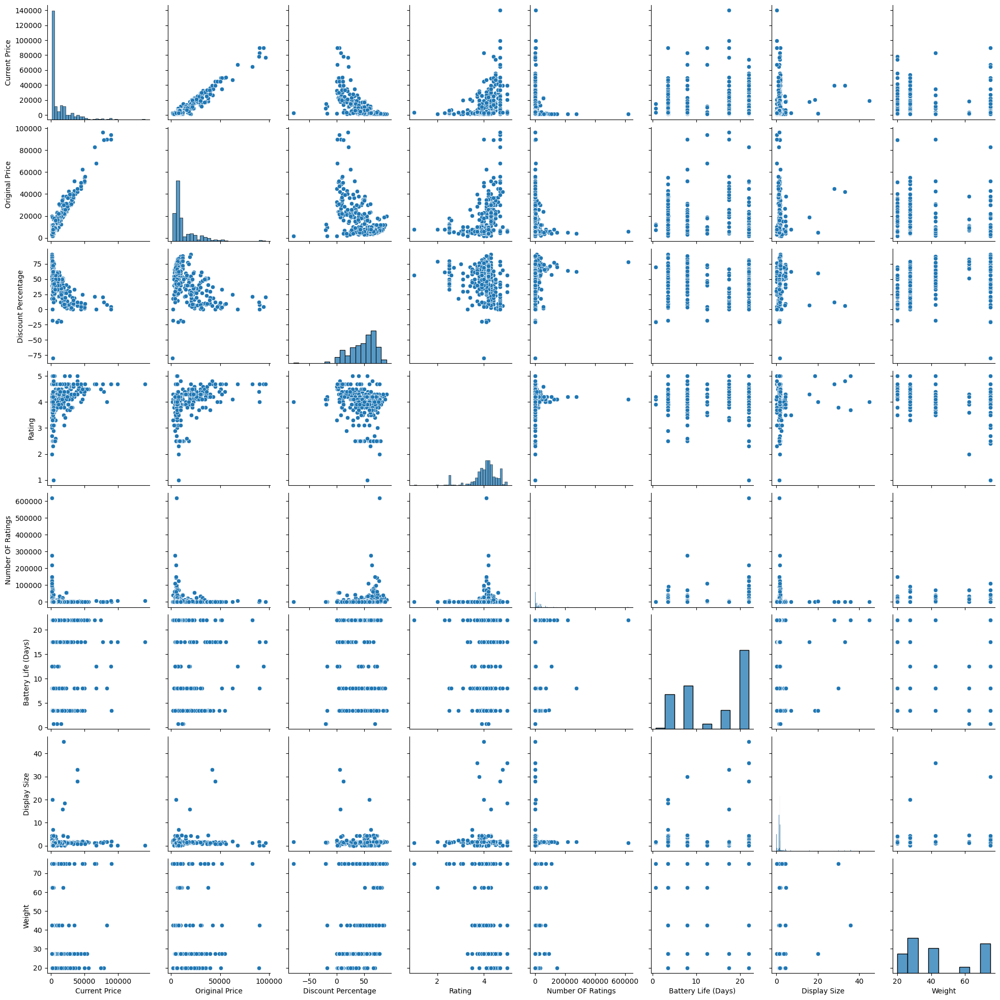

In [42]:
sns.pairplot(df)

In [36]:
#Handling outliers 
Q1 = np.percentile(df[numerical_data], 25)
Q3 = np.percentile(df[numerical_data], 75)
IQR = Q3 - Q1

# Define lower and upper bounds to identify outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers = np.where((df[numerical_data] < lower_bound) | (df[numerical_data] > upper_bound))

In [41]:
##fill nulls in numericalcolumns with mean 
numerical_data= [feature for feature in df.columns if df[feature].dtype !="object"]
numerical_data

['Current Price',
 'Original Price',
 'Discount Percentage',
 'Rating',
 'Number OF Ratings',
 'Battery Life (Days)',
 'Display Size',
 'Weight']

In [48]:
for col in numerical_data:
    df[col].fillna(df[col].mean(), inplace=True)

In [49]:
 df[numerical_data].isna().sum()

Current Price          0
Original Price         0
Discount Percentage    0
Rating                 0
Number OF Ratings      0
Battery Life (Days)    0
Display Size           0
Weight                 0
dtype: int64

In [50]:
df[categorical_data].isna().sum()

Brand               0
Model Name         35
Dial Shape        123
Strap Color       123
Strap Material     69
Touchscreen        37
Bluetooth           6
Display Size        0
Weight              0
dtype: int64

In [52]:
df[categorical_data].shape

(450, 9)

In [51]:
df["Model Name"].value_counts()

Model Name
beast pro                                                                        5
ring                                                                             5
Wave Call                                                                        3
Watch Flash                                                                      3
BSW024                                                                           3
                                                                                ..
Vertex 1.69" HealthEcosystem                                                     1
Wave Beat Call with BT Calling, 1.69 HD Display & 600+ Watch Face                1
Watch Mercury 1.54" TFTDisplay                                                   1
Wave Select with 1.69" HD Display, upto 10 Days Battery, HR & SpO2 Monitoring    1
Bip U pro 1.43 HD display GLONASS GPS & AI assistant                             1
Name: count, Length: 389, dtype: int64

In [53]:
df["Model Name"].fillna("beast pro",inplace=True)


In [55]:
df["Dial Shape"].value_counts()

Dial Shape
Circle          131
Square          101
Rectangle        87
Curved            6
Contemporary      1
Oval              1
Name: count, dtype: int64

In [56]:
df["Dial Shape"].fillna("Circle",inplace=True)

In [65]:
df["Bluetooth"].value_counts()
df["Bluetooth"].fillna("Yes",inplace=True)
         

In [58]:
df["Strap Color"].value_counts()
df["Strap Color"].fillna("Black",inplace=True)

In [60]:
df["Strap Material"].value_counts()
df["Strap Material"].fillna("Silicon",inplace=True)

In [62]:
df["Touchscreen"].value_counts()
df["Touchscreen"].fillna("Yes",inplace=True)

In [66]:
df[categorical_data].isna().sum()

Brand             0
Model Name        0
Dial Shape        0
Strap Color       0
Strap Material    0
Touchscreen       0
Bluetooth         0
Display Size      0
Weight            0
dtype: int64

In [67]:
df.head()

,Brand,Current Price,Original Price,Discount Percentage,Rating,Number OF Ratings,Model Name,Dial Shape,Strap Color,Strap Material,Touchscreen,Battery Life (Days),Bluetooth,Display Size,Weight
0,noise,82990.0,89900.0,7.686318,4.0,65.0,Wrb-sw-colorfitpro4alpha-std-rgld_pnk,Circle,Black,Silicon,Yes,8.0,Yes,1.7,42.5
1,fire-boltt,3799.0,16999.0,77.651627,4.3,20788.0,BSW046,Circle,Black,Silicon,Yes,3.5,Yes,1.8,62.5
2,boat,1999.0,7990.0,74.981227,3.8,21724.0,Wave Call,Circle,Black,Silicon,Yes,8.0,Yes,1.7,42.5
3,fire-boltt,1799.0,19999.0,91.004550,4.3,13244.0,BSW053,Circle,Black,Silicon,Yes,3.5,Yes,1.8,75.0
4,noise,1599.0,4999.0,68.013603,4.1,13901.0,Wrb-sw-colorfitpulsegobuzz-std-blk_blk,Circle,Black,Other,Yes,8.0,Yes,1.7,42.5


In [70]:
!pip install  ydata_profiling

import ydata_profiling as pp

In [75]:
pp.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [72]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

In [74]:
df[numerical_data]=scaler.fit_transform(df[numerical_data])


In [76]:
df.drop_duplicates(inplace=True)

In [77]:
df['Current Price'].replace(0, df['Current Price'].mean(), inplace=True)
df['Weight'].replace(0, df['Weight'].mean(), inplace=True)

In [78]:
pp.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [80]:
df[numerical_data].corr()

,Current Price,Original Price,Discount Percentage,Rating,Number OF Ratings,Battery Life (Days),Display Size,Weight
Current Price,1.000000,0.716712,-0.454082,0.389074,-0.127561,0.014164,0.018141,-0.101006
Original Price,0.716712,1.000000,-0.506895,0.297507,-0.121938,-0.115439,0.028735,-0.062865
Discount Percentage,-0.454082,-0.506895,1.000000,-0.195919,0.191436,0.017417,-0.031595,0.070955
Rating,0.389074,0.297507,-0.195919,1.000000,0.043720,-0.087734,0.056328,-0.109672
Number OF Ratings,-0.127561,-0.121938,0.191436,0.043720,1.000000,0.047812,-0.042185,0.013441
Battery Life (Days),0.014164,-0.115439,0.017417,-0.087734,0.047812,1.000000,0.023575,-0.131001
Display Size,0.018141,0.028735,-0.031595,0.056328,-0.042185,0.023575,1.000000,0.000439
Weight,-0.101006,-0.062865,0.070955,-0.109672,0.013441,-0.131001,0.000439,1.000000
